<a href="https://colab.research.google.com/github/MKBenjie/Object-Detection/blob/main/indoordetection_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # cloning into yolov5 repo
%cd yolov5
%pip install -qr requirements.txt  # install required dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output #to display images

Cloning into 'yolov5'...
remote: Enumerating objects: 14906, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 14906 (delta 11), reused 13 (delta 2), pack-reused 14880
Receiving objects: 100% (14906/14906), 13.87 MiB | 17.67 MiB/s, done.
Resolving deltas: 100% (10256/10256), done.
/content/yolov5
     |████████████████████████████████| 184 kB 34.8 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 1.6 MB 57.3 MB/s 
     |████████████████████████████████| 45 kB 2.6 MB/s 
     |████████████████████████████████| 67 kB 7.7 MB/s 
     |████████████████████████████████| 54 kB 3.7 MB/s 
     |████████████████████████████████| 138 kB 66.2 MB/s 
     |████████████████████████████████| 178 kB 71.1 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
#setting up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:

rf = Roboflow(api_key="wrtmUq5F8rDg4fNqiv4r")
project = rf.workspace().project("detecting-indoor-objects-for-visually-impaired")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to /content/datasets/Detecting-Indoor-Objects-For-Visually-Impaired-1 in yolov5pytorch:: 100%|██████████| 2370/2370 [00:00<00:00, 2511.03it/s]


In [ ]:
!python train.py --img 416 --data {dataset.location}/data.yaml --epochs 200 --weights yolov5s.pt --cache  --batch-size 24

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Detecting-Indoor-Objects-For-Visually-Impaired-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=24, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2,

In [ ]:
#stating tensorboard
#launch after  I have started traing
#logs save in the folder "runs"

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/datasets/Detecting-Indoor-Objects-For-Visually-Impaired-1/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
image 1/177 /content/datasets/Detecting-Indoor-Objects-For-Visually-Impaired-1/valid/images/000c66e044e850f7_jpg.rf.026cd0fae1c8ba9ecc3a5f4a06b9b0c7.jpg: 416x416 1 Door, 8.1ms
image 2/177 /content/datasets/Detecting-Indoor-Objects-For-Visually-Impaired-1/valid/images/000cf08de329f81b_jp

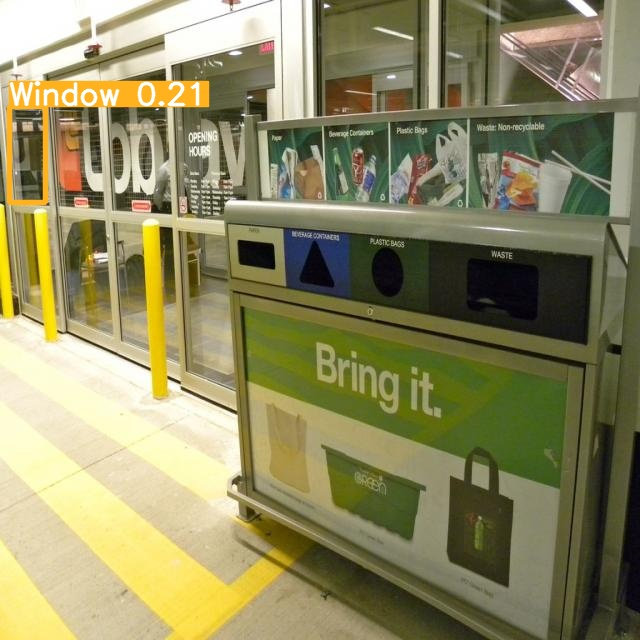

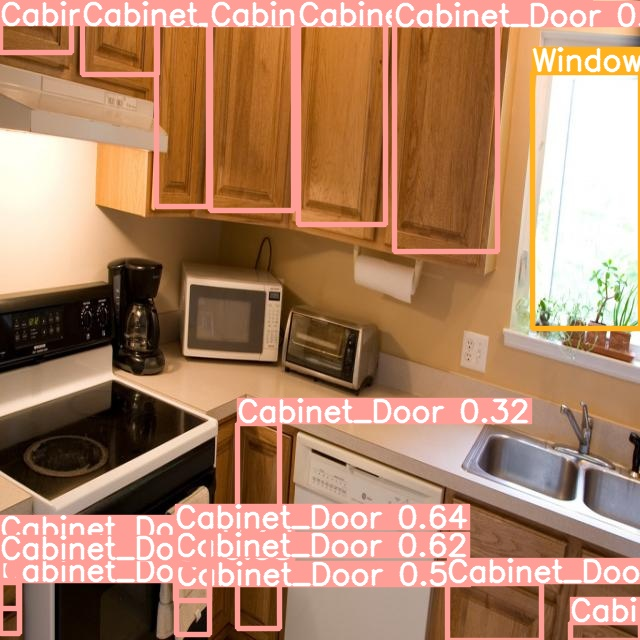

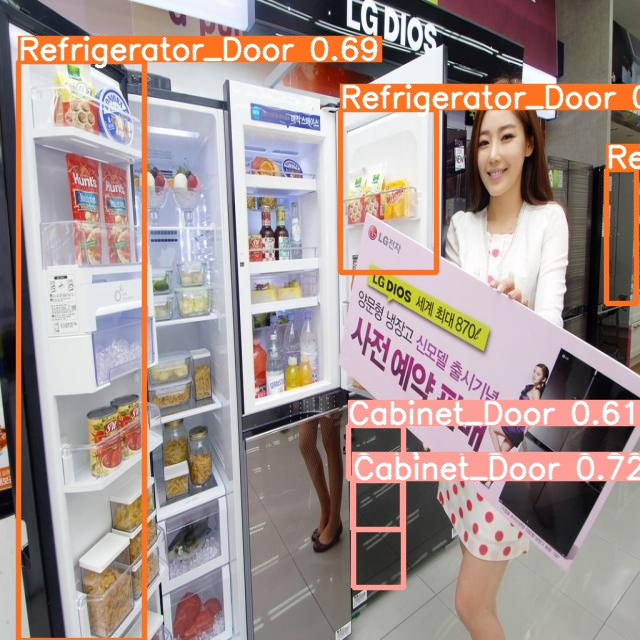

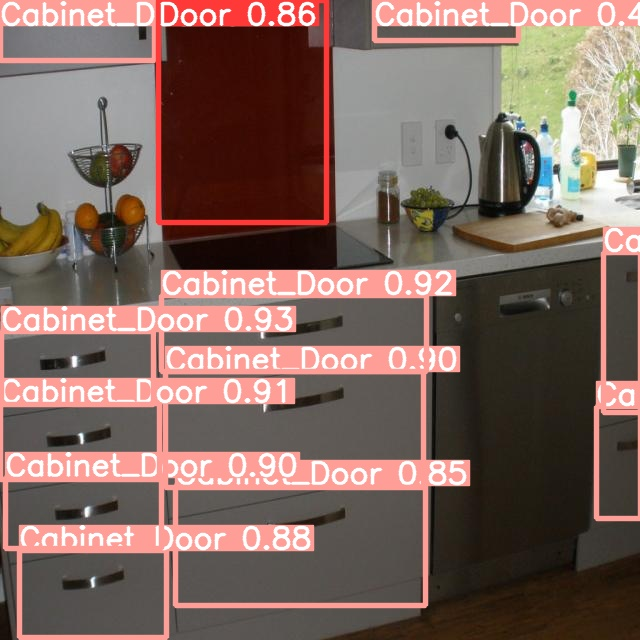

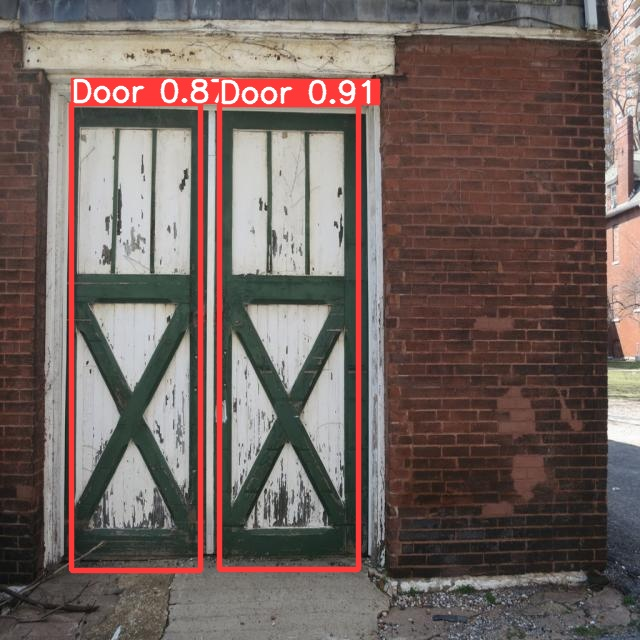

...

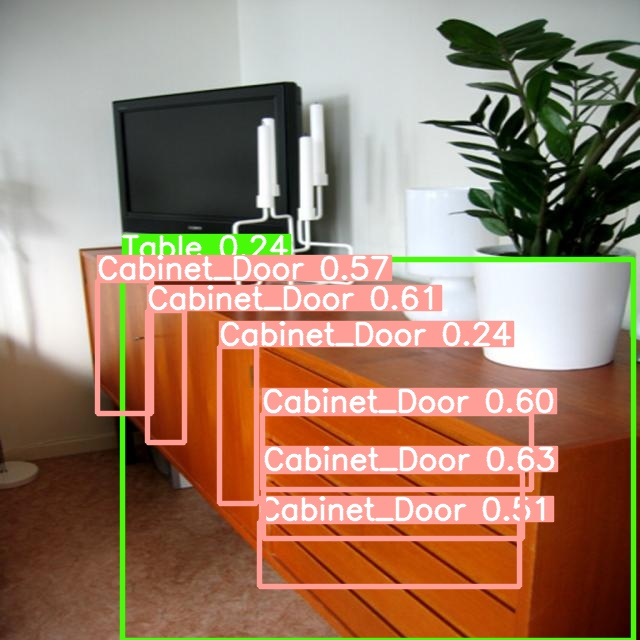

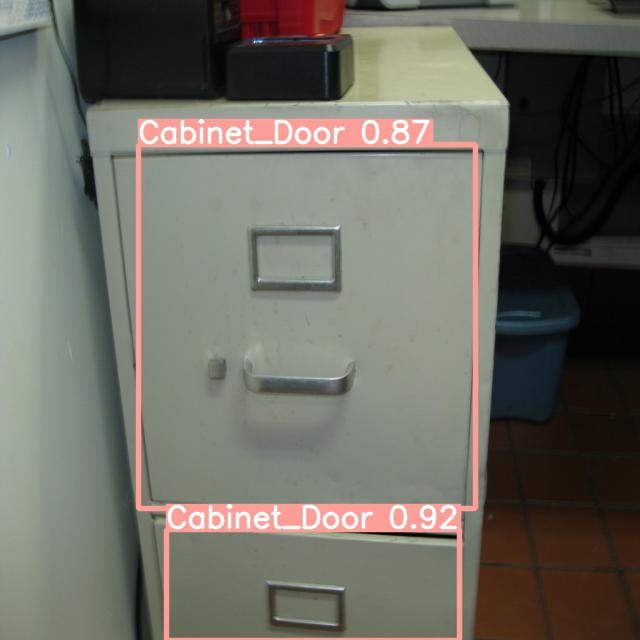

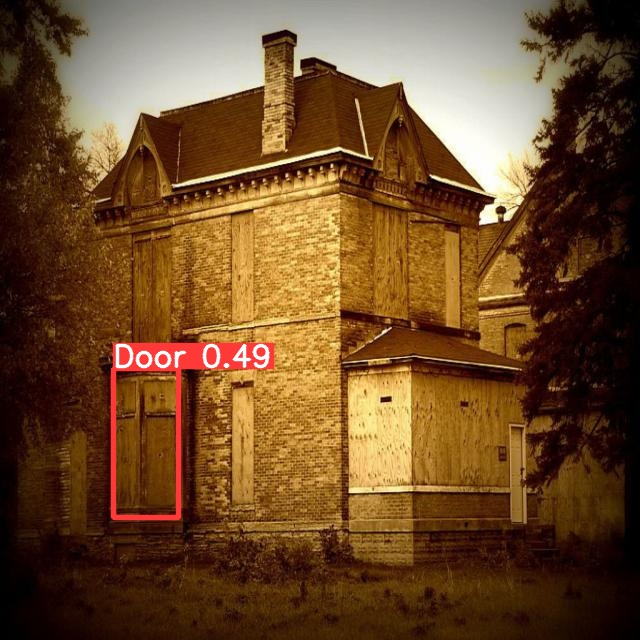

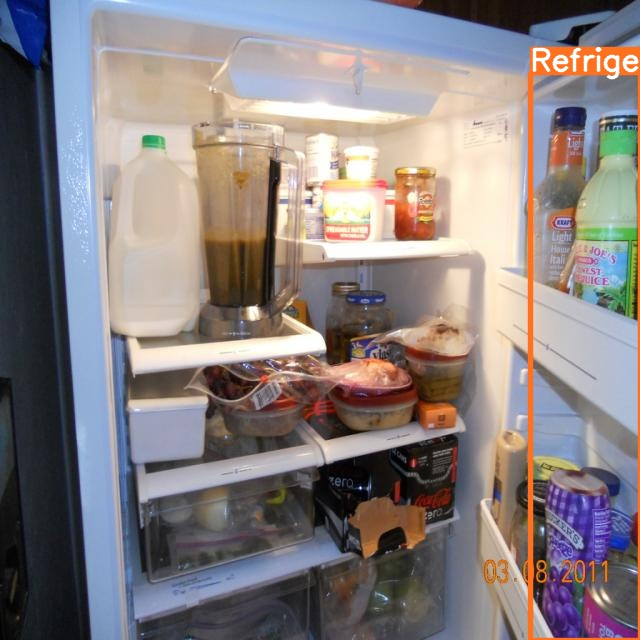

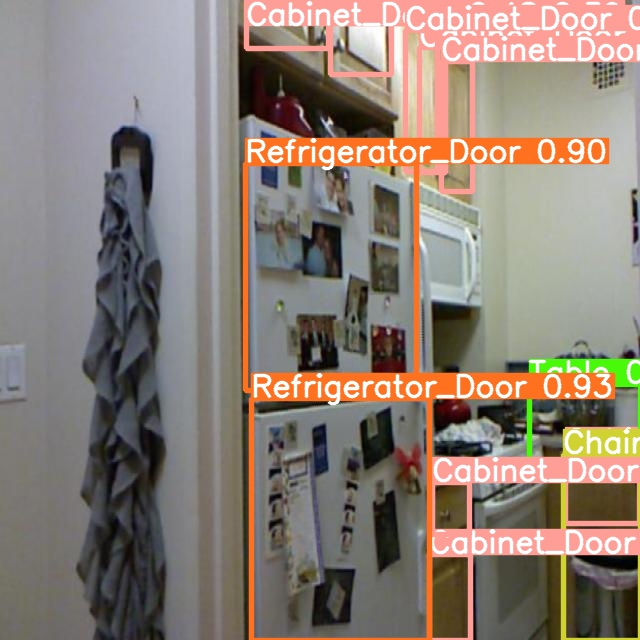

In [ ]:
#display inference on all test images

import glob
from IPython.display import Image, display

i = 0
#choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*'):
  i += 1

  if i < 30:
    display(Image(filename = imageName))
    print("\n")

In [ ]:
#saving model

from google.colab import files
files.download('./runs/train/exp2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>